<a href="https://colab.research.google.com/github/jcdumlao14/Projects/blob/main/Income.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **"Multi-class Classification with AutoML(PyCaret): Exploring the Predictive Power of Data to Determine Earnings"**



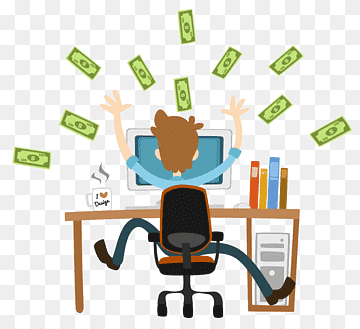

Reference: Kaggle.com Datasets/[Income Classification](https://www.kaggle.com/datasets/lodetomasi1995/income-classification)

# **Introduction**

"Are you curious about how data can be used to predict a person's income level? The prediction task of determining whether a person makes over 50K a year may seem like a daunting challenge, but with the help of a comprehensive dataset, we can uncover fascinating insights into the attributes that influence a person's earnings. This dataset includes a diverse range of attributes, such as occupation, education, age, and even native country. By analyzing these variables, we can gain a deeper understanding of the factors that contribute to a person's income and explore the exciting possibilities that predictive analysis has to offer."

# **Objectives**

The objective of this study is to use a comprehensive dataset to analyze the attributes that influence a person's income level and to develop a predictive model that can accurately determine whether an individual makes over 50K a year. By exploring the relationship between various factors, such as occupation, education, age, and native country, we aim to gain a deeper understanding of the drivers of income and how predictive analysis can be used to generate valuable insights.

|About Dataset Listing of attributes:|  |
|---------------|:--------------------|
|50K, <=50K.|
|age| continuous.|
|workclass|Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.|
|fnlwgt|continuous.|
|education| Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool.|
|education-num| continuous.|
|marital-status| Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.|
|occupation|Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.|
|relationship|Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.|
|race|White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.|
|sex| Female, Male.|
|capital-gain|continuous.|
|capital-loss|continuous.|
|hours-per-week|continuous.|
|native-country| United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.|

# **Importing Libraries**

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

#For Data Visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
import re

import warnings
warnings.filterwarnings("ignore")


# Installing pycaret

In [ ]:
%%capture
!pip install pycaret


In [ ]:
%%capture
!pip install dash

In [ ]:
%%capture
!pip install dash plotly pandas


# 1. Data Setup

In [ ]:
income_df = pd.read_csv("/content/income_evaluation.csv")



In [ ]:
income_df.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [ ]:
col_names = ['age',	'workclass','fnlwgt','education',	'education_num','marital_status',	'occupation',	
             'relationship','race',	'sex','capital_gain',	'capital_loss',	'hours_per_week',	'native_country','income']
income_df.columns = col_names
income_df.columns

Index(['age', 'workclass', 'fnlwgt', 'education', 'education_num',
       'marital_status', 'occupation', 'relationship', 'race', 'sex',
       'capital_gain', 'capital_loss', 'hours_per_week', 'native_country',
       'income'],
      dtype='object')

# **Exploratory Data Analysis**

In [ ]:
income_df.shape

(32561, 15)

In [ ]:
income_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education_num   32561 non-null  int64 
 5   marital_status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital_gain    32561 non-null  int64 
 11  capital_loss    32561 non-null  int64 
 12  hours_per_week  32561 non-null  int64 
 13  native_country  32561 non-null  object
 14  income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [ ]:
categorical_feature =[feature for feature in income_df.columns if income_df[feature].dtype =='0']
print("len of categorical_feature:",len(categorical_feature))

len of categorical_feature: 0


In [ ]:
for col in categorical_feature:
  income_df[col] = income_df[col].str.strip()

In [ ]:
income_df['income'].value_counts()

 <=50K    24720
 >50K      7841
Name: income, dtype: int64

## 2.a Count of income

In [ ]:
fig = px.histogram(income_df, x='income', color_discrete_sequence=['#636EFA'])
fig.update_layout(title="Count of income")
fig.show()

## 2.b Education vs Income

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create the subplot
fig = make_subplots(rows=1, cols=2, specs=[[{"type": "table"}, {"type": "bar"}]])

# Add the table trace
table_trace = go.Table(
    header=dict(values=list(income_df.columns),
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[income_df[col] for col in income_df.columns],
               fill_color='lavender',
               align='left'))

fig.add_trace(table_trace, row=1, col=1)

# Add the bar chart trace
bar_trace = go.Bar(x=income_df['education'], y=income_df['income'], marker=dict(color='blue'))

fig.add_trace(bar_trace, row=1, col=2)

# Set the layout
fig.update_layout(height=500, width=900, title_text="Education vs Income")

# Show the plot
fig.show()


In [ ]:
income_df['workclass'] =np.where(income_df['workclass']=='?',np.NaN,income_df['workclass'])

## 2.c Count of Workclass

In [ ]:
import plotly.express as px

fig = px.histogram(income_df, x='workclass', color_discrete_sequence=['#636EFA'])
fig.update_layout(title="Count of Workclass")
fig.show()


## 2.d Distribution of Income by Workclass

In [ ]:
fig = px.histogram(income_df, x='workclass', color='income', barmode='group', title='Distribution of Income by Workclass')
fig.show()

This will produce a bar chart showing the number of individuals in each workclass category, with bars colored according to their income level (<=50K or >50K). The chart provides an overview of the relationship between workclass and income.

## 2.e Scatter plot of Age versus Hours Worked per Week

In [ ]:
# Create a scatter plot of age versus hours worked per week
fig = px.scatter(income_df, x="age", y="hours_per_week", color="income",
                 title="Scatter plot of Age versus Hours Worked per Week")
fig.show()

This will produce a scatter plot with age on the x-axis and hours worked per week on the y-axis. The plot is colored based on income, with blue points representing incomes less than or equal to 50K and orange points representing incomes greater than 50K. The plot can help visualize any patterns or relationships between age and hours worked per week, and how they may be related to income levels.

## 2.f Count of Marital Status

In [ ]:
fig = px.histogram(income_df, x='marital_status', color='income', barmode='group', title='Count of Marital Status')
fig.show()

## 2.g Distribution of Income by Marital Status

In [ ]:
# Create the violin plot
fig = px.violin(income_df, y="income", x="marital_status", box=True, points="all", 
                color_discrete_sequence=['#636EFA', '#EF553B'], 
                category_orders={"marital_status": ['Never-married', 'Married-civ-spouse', 'Divorced', 'Married-spouse-absent', 'Separated', 'Married-AF-spouse', 'Widowed']})
fig.update_layout(title="Distribution of Income by Marital Status", xaxis_title="Marital Status", yaxis_title="Income")
fig.show()

The resulting plot shows the distribution of income for each marital status category, including the median, quartiles, and range of incomes.

## 2.h Income Distribution by Relationship Status

In [ ]:
import plotly.express as px

# create a DataFrame with the count of each income level by relationship status
income_df = income_df.groupby(['relationship', 'income']).size().reset_index(name='count')

# create the pie chart
fig = px.pie(income_df, values='count', names='relationship', color='income',
             title='Income & Count Distribution by Relationship Status')
fig.show()


This will generate a pie chart that shows the count of individuals in each relationship status group, with the sections of the pie chart color-coded by their income level.

## 2.i Count of Sex

In [ ]:
# Create the plot
fig = px.histogram(income_df, x='sex', color='income')
fig.show()

This will produce a histogram of the `sex` column, with bars colored based on the `income` column. The resulting plot should help us visualize the distribution of income based on gender.

In [ ]:
income_df['occupation'] = np.where(income_df['occupation']=='?',np.NaN,income_df['occupation'])

This line of code is using the NumPy where function to replace any occurrences of the value "?" in the "occupation" column of the income_df dataframe with NaN values.

The np.where function is a conditional function that takes three arguments: a condition, a value to return when the condition is True, and a value to return when the condition is False. In this case, the condition is income_df['occupation'] == '?', which creates a boolean mask that is True wherever the "occupation" column of income_df is equal to "?". The True elements of the mask are replaced with np.NaN, which is a special value that represents a missing value in pandas. The False elements of the mask are replaced with the original values in the "occupation" column.

In summary, this line of code is replacing any occurrences of "?" in the "occupation" column with NaN values, which is a common way to handle missing data in pandas.

## 2.j Occupation Counts

In [ ]:
import plotly.graph_objs as go

# Calculate the count of each occupation
occupation_counts = income_df['occupation'].value_counts()

# Create a horizontal table
table = go.Table(
    header=dict(values=['Occupation', 'Count']),
    cells=dict(values=[occupation_counts.index, occupation_counts.values])
)

# Create a horizontal bar chart
bar = go.Bar(
    x=occupation_counts.values,
    y=occupation_counts.index,
    orientation='h'
)


# Combine the table and bar chart into a subplot
fig = go.Figure(data = [table, bar], layout={
    'title': {'text': 'Occupation Counts'},
    'grid': {'rows': 1, 'columns': 2},
    'width': 1100,
    'height':900,
    'margin': {'l': 100, 'r': 100, 't': 100, 'b': 100},
    'paper_bgcolor': 'white',
    'plot_bgcolor': 'white'
})

fig.show()


This will create a horizontal table on the left showing the count of each occupation, and a horizontal bar chart on the right visualizing the same information. You can modify the layout to suit your needs.

## 2.k Occupation, Age grouped by income category

In [ ]:
fig = px.bar(income_df, x='occupation', y='age', color='income', barmode='group')

# Show the plot
fig.show()

This will create a bar plot where the x-axis is the occupation, the y-axis is the age, and the bars are grouped by income category. The color of the bars indicates whether the income is above or below 50K.

In [ ]:
fig = px.imshow(income_df.corr(), x=income_df.columns, y=income_df.columns[::-1], 
                 color_continuous_scale='RdBu', zmin=-1, zmax=1)
fig.show()

## 2.l Native Country vs Income

In [ ]:
# Group by native country and income
country_income = income_df.groupby(['native_country', 'income'], as_index=False).size()

# Rename columns for treemap plotting
country_income.columns = ['native_country', 'income', 'count']

# Plot treemap
fig = px.treemap(country_income, path=['native_country', 'income'], values='count',
                 color='count', color_continuous_scale='RdBu', title='Native Country vs Income')
fig.show()


This will generate a Treemap plot showing the distribution of income levels for each native country in the dataset. The size of each rectangle represents the number of individuals in the dataset from that country, and the color represents the proportion of individuals in each income bracket.

In [ ]:
income_df['native_country'].unique()

array([' United-States', ' Cuba', ' Jamaica', ' India', ' ?', ' Mexico',
       ' South', ' Puerto-Rico', ' Honduras', ' England', ' Canada',
       ' Germany', ' Iran', ' Philippines', ' Italy', ' Poland',
       ' Columbia', ' Cambodia', ' Thailand', ' Ecuador', ' Laos',
       ' Taiwan', ' Haiti', ' Portugal', ' Dominican-Republic',
       ' El-Salvador', ' France', ' Guatemala', ' China', ' Japan',
       ' Yugoslavia', ' Peru', ' Outlying-US(Guam-USVI-etc)', ' Scotland',
       ' Trinadad&Tobago', ' Greece', ' Nicaragua', ' Vietnam', ' Hong',
       ' Ireland', ' Hungary', ' Holand-Netherlands'], dtype=object)

In [ ]:
native = income_df["native_country"].value_counts().to_dict()

In [ ]:
income_df["native_country"]=income_df["native_country"].map(native)

In [ ]:
income_df.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,29170,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,29170,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,29170,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,29170,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,95,<=50K


In [ ]:
%%capture
pip install plotly --upgrade

##2.m Average Age by Country

In [ ]:
# Calculate the average age by state
avg_age_by_state = income_df.groupby('native_country')['age'].mean().reset_index()

# Create the choropleth map
fig = px.choropleth(avg_age_by_state, locations='native_country', locationmode='country names',
                    color='age', range_color=(20, 60), color_continuous_scale='YlOrRd',
                    title='Average Age by Country', labels={'native_country': 'Country', 'age': 'Average Age'},
                    hover_name='native_country', hover_data={'age': ':.1f'})

fig.show()


In [ ]:
from sklearn.preprocessing import LabelEncoder

In [ ]:
cols = ['sex','income']
for col in cols:
  income_df[col] = pd.get_dummies(income_df[col],drop_first=True)

In [ ]:
income_df.head(3)

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,1,2174,0,40,United-States,0
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,1,0,0,13,United-States,0
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,1,0,0,40,United-States,0


In [ ]:
categorical = [feature for feature in income_df.columns if income_df[feature].dtype =='0']
categorical

[]

In [ ]:
for col in categorical:
  labels = income_df.groupby(col)['income'].mean().sort_values().index
  print(col,'\n',labels, '\n')

In [ ]:
for col in categorical:
  labels = income_df.groupby(col)['income'].mean().sort_values().index
  mapping_dict ={k: i for i, k in enumerate(labels,0)}

  income_df[col] = income_df[col].map(mapping_dict)

# **3. Set up the Environment**

This step involves importing PyCaret and the necessary dataset, and initializing the environment using the setup() function. This function handles data preprocessing, feature engineering, and other important steps that prepare the data for modeling.

In [ ]:
%%capture
!pip install --pre pycaret

In [ ]:
import sys
sys.argv = [arg for arg in sys.argv if not arg.startswith("-f")]


In [ ]:
from pycaret import classification
from setuptools import setup

In [ ]:
from pycaret.regression import *

In [ ]:
mclf_setup = setup(data = income_df,  target = 'income')

,Description,Value
0,session_id,6810
1,Target,income
2,Original Data,"(32561, 15)"
3,Missing Values,False
4,Numeric Features,6
5,Categorical Features,8
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(22792, 105)"


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[], target='income',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strategy=...
                ('scaling', 'passthrough'), ('P_transform', 'passthrough'),
                ('binn', 'passthrough'), ('rem_outliers', 'passthrough'),
                ('cluster_all', 'passthrough'),
              

In [ ]:
mclf_setup

(None,
 'reg-default-name',
 {'USI',
  'X',
  'X_test',
  'X_train',
  '_all_metrics',
  '_all_models',
  '_all_models_internal',
  '_available_plots',
  '_gpu_n_jobs_param',
  '_internal_pipeline',
  '_ml_usecase',
  'create_model_container',
  'dashboard_logger',
  'data_before_preprocess',
  'display_container',
  'exp_name_log',
  'experiment__',
  'fix_imbalance_method_param',
  'fix_imbalance_param',
  'fold_generator',
  'fold_groups_param',
  'fold_groups_param_full',
  'fold_param',
  'fold_shuffle_param',
  'gpu_param',
  'html_param',
  'imputation_classifier',
  'imputation_regressor',
  'iterative_imputation_iters_param',
  'log_plots_param',
  'logging_param',
  'master_model_container',
  'n_jobs_param',
  'prep_pipe',
  'pycaret_globals',
  'seed',
  'stratify_param',
  'target_param',
  'transform_target_method_param',
  'transform_target_param',
  'y',
  'y_test',
  'y_train'},
 'income',
 [],
 -1,
        age          workclass  fnlwgt    education  education_num  \


In [ ]:
%%capture
! pip install autoviz

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
eda(display_format='bokeh')

# **4. Compare Models**
 
Once the environment is set up, the compare_models() function is used to compare the performance of different machine learning models on the dataset.

In [ ]:
#%%capture
#!pip install numpy --upgrade

In [ ]:
compare_models(fold=5)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.1893,0.0914,0.3024,0.5021,0.2123,0.3857,0.668
gbr,Gradient Boosting Regressor,0.2154,0.0975,0.3122,0.4692,0.2193,0.4338,2.820
rf,Random Forest Regressor,0.1906,0.1032,0.3212,0.4384,0.2267,0.3820,11.134
et,Extra Trees Regressor,0.1921,0.1159,0.3404,0.3691,0.2395,0.3870,11.208
br,Bayesian Ridge,0.2651,0.1166,0.3415,0.3651,0.2421,0.4965,0.232
ridge,Ridge Regression,0.2651,0.1167,0.3416,0.3646,0.2423,0.4947,0.052
lr,Linear Regression,0.2651,0.1167,0.3416,0.3645,0.2423,0.4943,0.650
omp,Orthogonal Matching Pursuit,0.2593,0.1218,0.3490,0.3369,0.2461,0.5180,0.058
ada,AdaBoost Regressor,0.3015,0.1287,0.3587,0.2994,0.2623,0.4717,1.200
en,Elastic Net,0.3287,0.1583,0.3979,0.1382,0.2770,0.6880,0.076


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 2
INFO:logs:LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=6810, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
INFO:logs:compare_models() succesfully completed......................................


LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=6810, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

In [ ]:
top3 = compare_models(n_select = 3)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,1.891000e-01,9.140000e-02,3.022000e-01,5.023000e-01,0.2122,3.863000e-01,0.504
gbr,Gradient Boosting Regressor,2.150000e-01,9.740000e-02,3.121000e-01,4.695000e-01,0.2191,4.341000e-01,4.093
rf,Random Forest Regressor,1.904000e-01,1.035000e-01,3.217000e-01,4.365000e-01,0.2270,3.803000e-01,11.423
br,Bayesian Ridge,2.650000e-01,1.166000e-01,3.414000e-01,3.653000e-01,0.2420,4.965000e-01,0.263
ridge,Ridge Regression,2.650000e-01,1.167000e-01,3.415000e-01,3.647000e-01,0.2422,4.949000e-01,0.054
lr,Linear Regression,2.651000e-01,1.167000e-01,3.416000e-01,3.646000e-01,0.2422,4.947000e-01,0.104
et,Extra Trees Regressor,1.927000e-01,1.172000e-01,3.423000e-01,3.618000e-01,0.2408,3.876000e-01,14.034
omp,Orthogonal Matching Pursuit,2.593000e-01,1.218000e-01,3.489000e-01,3.370000e-01,0.2461,5.182000e-01,0.064
ada,AdaBoost Regressor,2.981000e-01,1.282000e-01,3.580000e-01,3.022000e-01,0.2611,4.748000e-01,0.878
huber,Huber Regressor,3.177000e-01,1.525000e-01,3.902000e-01,1.696000e-01,0.2721,6.485000e-01,1.286


INFO:logs:create_model_container: 35
INFO:logs:master_model_container: 35
INFO:logs:display_container: 3
INFO:logs:[LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=6810, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0), GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_e

In PyCaret, compare_models is a function used for model selection and tuning. By default, compare_models runs and compares performance of all models available in PyCaret's model library.

The n_select parameter in compare_models specifies the number of top performing models to select based on a chosen performance metric. In the code you provided, n_select = 3 means that the function will select the top three performing models based on the default performance metric, which is Accuracy for classification tasks and R2 for regression tasks.

The selected top three models are then stored in the top3 variable, which can be used for further model evaluation or ensemble building.

In [ ]:
top3

[LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=6810, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0),
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                           init=None, learning_rate=0.1, loss='ls', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                 

# **5. Create a Model**

After comparing different models, the create_model() function is used to create the model that will be used for making predictions. This function takes the name of the desired model as an argument.

In [ ]:
lightgbm_model=create_model('lightgbm')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.1801,0.0837,0.2893,0.5461,0.2028,0.3658
1,0.1866,0.0931,0.3051,0.4858,0.2138,0.3997
2,0.1886,0.0907,0.3012,0.5092,0.2106,0.3966
3,0.1914,0.0915,0.3025,0.5070,0.2125,0.3823
4,0.1965,0.0961,0.3099,0.4773,0.2179,0.3897
5,0.1882,0.0906,0.3009,0.5143,0.2128,0.3598
6,0.1946,0.0976,0.3124,0.4643,0.2183,0.4114
7,0.1806,0.0848,0.2912,0.5391,0.2039,0.3810
8,0.1961,0.0937,0.3061,0.4883,0.2162,0.3855


INFO:logs:create_model_container: 36
INFO:logs:master_model_container: 36
INFO:logs:display_container: 4
INFO:logs:LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=6810, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
%%capture
!pip install fairlearn

INFO:logs:Initializing get_config()
INFO:logs:get_config(variable=X_test)
INFO:logs:Global variable: X_test returned as         age    fnlwgt  sex  capital_gain  capital_loss  hours_per_week  \
31184  33.0  204752.0    1           0.0           0.0            40.0   
8656   36.0  313853.0    1           0.0           0.0            45.0   
8450   52.0  122109.0    0           0.0         323.0            40.0   
4191   26.0   76996.0    0           0.0           0.0            38.0   
16763  55.0  106740.0    1           0.0           0.0            40.0   
...     ...       ...  ...           ...           ...             ...   
6311   37.0   31368.0    1           0.0           0.0            40.0   
8054   42.0  132481.0    0           0.0           0.0            24.0   
26805  37.0  187346.0    0           0.0           0.0            40.0   
17127  51.0  201127.0    1           0.0           0.0            45.0   
4363   43.0   77370.0    1           0.0           0.0            

,Samples,MAE,MSE,RMSE,R2,RMSLE,MAPE
income,,,,,,,
0,7455.0,0.123741,0.044574,0.044574,0.0,0.173135,NaN
1,2314.0,0.387492,0.233120,0.233120,0.0,0.299342,0.387492


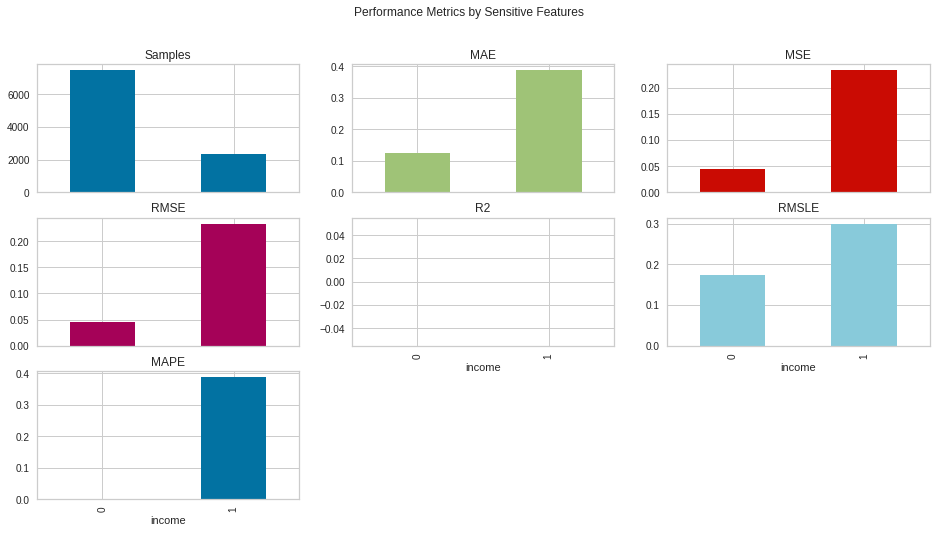

In [ ]:
# check fairness
check_fairness(lightgbm_model, sensitive_features= ['income'])

The following are some common evaluation metrics used in regression models:

1. MAE (Mean Absolute Error): It measures the average magnitude of the errors in a set of predictions, without considering their direction. It is calculated by taking the absolute differences between the predicted values and the actual values and then averaging them.

2. MSE (Mean Squared Error): It measures the average of the squared differences between the predicted values and the actual values. It gives a higher weight to large errors than to small ones.

3. RMSE (Root Mean Squared Error): It is the square root of the MSE and gives an estimate of the standard deviation of the residuals. It is also in the same unit as the target variable, which makes it easier to interpret.

4. R2 (Coefficient of Determination): It measures how well the regression line fits the actual data. It ranges from 0 to 1, where 1 means a perfect fit.

5. RMSLE (Root Mean Squared Log Error): It is similar to RMSE but applies the logarithm function to the predicted and actual values first. This is useful when the target variable has a large range of values.

6. MAPE (Mean Absolute Percentage Error): It measures the average absolute percentage difference between the predicted values and the actual values. It is useful when the target variable has a wide range of values and you want to evaluate the performance of the model in terms of relative error.






# **6. Tune the Model**

To improve the performance of the model, the tune_model() function can be used to optimize the hyperparameters of the model.

In [ ]:
%%capture
!pip install scikit-optimize

In [ ]:
tuned_lightgbm_model=tune_model(lightgbm_model)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.1874,0.0854,0.2923,0.5367,0.2050,0.3812
1,0.1942,0.0940,0.3066,0.4805,0.2147,0.4193
2,0.1997,0.0936,0.3059,0.4940,0.2138,0.4222
3,0.2017,0.0953,0.3087,0.4865,0.2166,0.4078
4,0.2085,0.0999,0.3160,0.4565,0.2225,0.4155
5,0.1978,0.0931,0.3052,0.5004,0.2156,0.3810
6,0.2035,0.0998,0.3159,0.4523,0.2209,0.4306
7,0.1914,0.0881,0.2968,0.5213,0.2072,0.4096
8,0.2046,0.0964,0.3106,0.4732,0.2191,0.4079


INFO:logs:create_model_container: 37
INFO:logs:master_model_container: 37
INFO:logs:display_container: 5
INFO:logs:LGBMRegressor(bagging_fraction=0.5, bagging_freq=0, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=0.8,
              importance_type='split', learning_rate=0.15, max_depth=-1,
              min_child_samples=76, min_child_weight=0.001, min_split_gain=0.2,
              n_estimators=290, n_jobs=-1, num_leaves=70, objective=None,
              random_state=6810, reg_alpha=4, reg_lambda=0.5, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
INFO:logs:tune_model() succesfully completed......................................


# **7. Plot Model Performance**

The plot_model() function can be used to visualize the performance of the model on the training set.

## **a. Validation Curve**

Validation Curve - It is a plot that shows the performance of the model on the training and validation sets for different hyperparameter values.

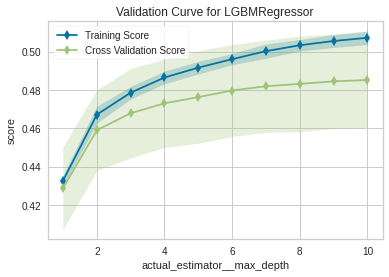

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_lightgbm_model, plot = 'vc')

## **b. Recursive Feature Selection**

Recursive Feature Selection - It is a technique to select the most important features for a model by recursively removing the least important features.

In [ ]:
plot_model(tuned_lightgbm_model, plot = 'rfe')

## **c. Feature Importance**

Feature Importance - It is a plot that shows the importance of each feature for a model.

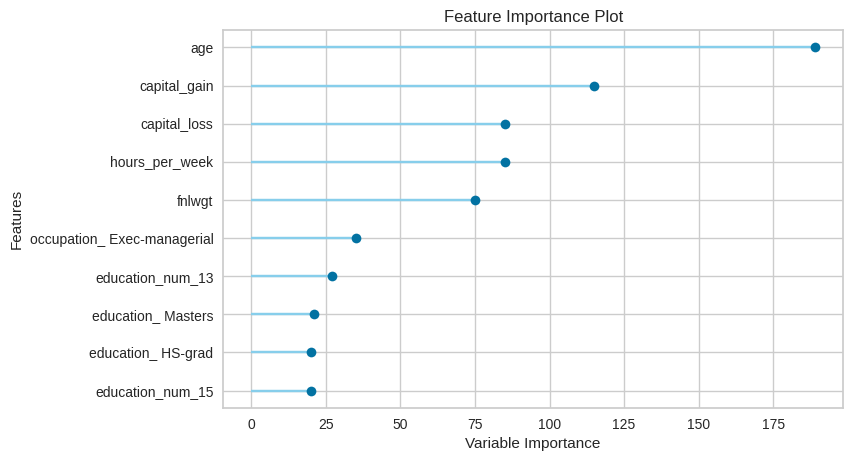

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_lightgbm_model, plot = 'feature')

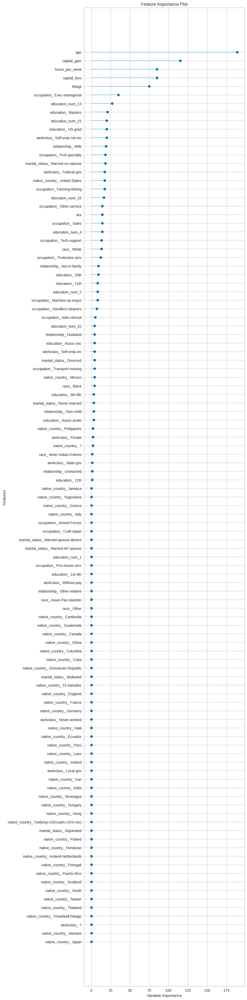

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_lightgbm_model, plot = 'feature_all')

## **d. Learning Curve**

Learning Curve - It is a plot that shows the performance of the model on the training and validation sets for different sample sizes.

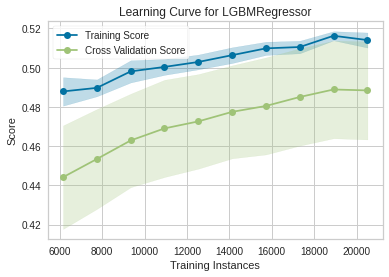

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(tuned_lightgbm_model, plot = 'learning')

Class Prediction Error - It is a plot that shows the proportion of incorrect predictions for each class in a multi-class classification problem.

In [ ]:
plot_model(tuned_lightgbm_model, plot = 'error')

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


## **e. Model Hyperparameter**

Model Hyperparameter - It is a plot that shows the performance of the model on the training and validation sets for different hyperparameter values.

In [ ]:
plot_model(tuned_lightgbm_model, plot = 'parameter')

,Parameters
boosting_type,gbdt
class_weight,None
colsample_bytree,1.0
importance_type,split
learning_rate,0.15
max_depth,-1
min_child_samples,76
min_child_weight,0.001
min_split_gain,0.2
n_estimators,290


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


We use `create_model()` to train a lightgbm model on the dataset. Finally, we pass the trained model to `interpret_model()` to generate interpretation plots.

In [ ]:
%%capture
!pip install shap

In [ ]:
%matplotlib

Using matplotlib backend: agg


In [ ]:
lightgbm = create_model('lightgbm')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.1801,0.0837,0.2893,0.5461,0.2028,0.3658
1,0.1866,0.0931,0.3051,0.4858,0.2138,0.3997
2,0.1886,0.0907,0.3012,0.5092,0.2106,0.3966
3,0.1914,0.0915,0.3025,0.5070,0.2125,0.3823
4,0.1965,0.0961,0.3099,0.4773,0.2179,0.3897
5,0.1882,0.0906,0.3009,0.5143,0.2128,0.3598
6,0.1946,0.0976,0.3124,0.4643,0.2183,0.4114
7,0.1806,0.0848,0.2912,0.5391,0.2039,0.3810
8,0.1961,0.0937,0.3061,0.4883,0.2162,0.3855


INFO:logs:create_model_container: 38
INFO:logs:master_model_container: 38
INFO:logs:display_container: 6
INFO:logs:LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=6810, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
from pycaret.classification import *
from pycaret.regression import *

## f. Interpret the Model

In [ ]:
%%capture
!pip install numba==0.53.1

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=6810, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=summary, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: summary
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values
INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


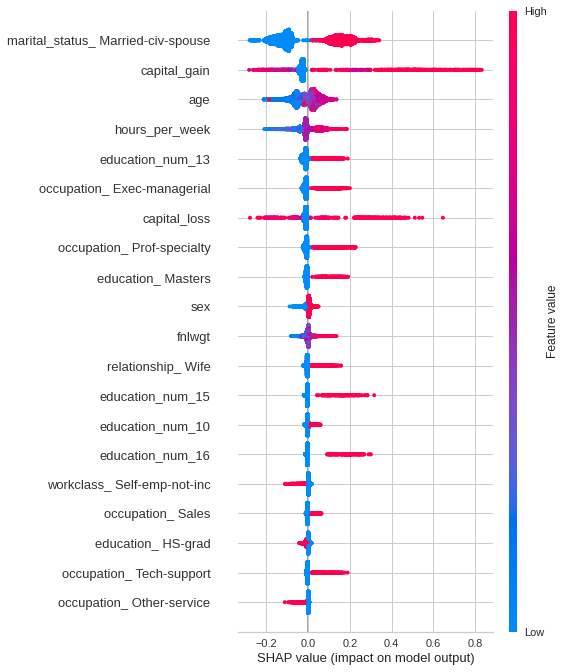

In [ ]:
interpret_model(lightgbm)

The function interpret_model( ) only supports tree-based models for binary classification, specifically `et`, `rf`, `lightgbm`, and `dt`.

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=LGBMRegressor(bagging_fraction=0.5, bagging_freq=0, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=0.8,
              importance_type='split', learning_rate=0.15, max_depth=-1,
              min_child_samples=76, min_child_weight=0.001, min_split_gain=0.2,
              n_estimators=290, n_jobs=-1, num_leaves=70, objective=None,
              random_state=6810, reg_alpha=4, reg_lambda=0.5, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=summary, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: summary
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values
INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


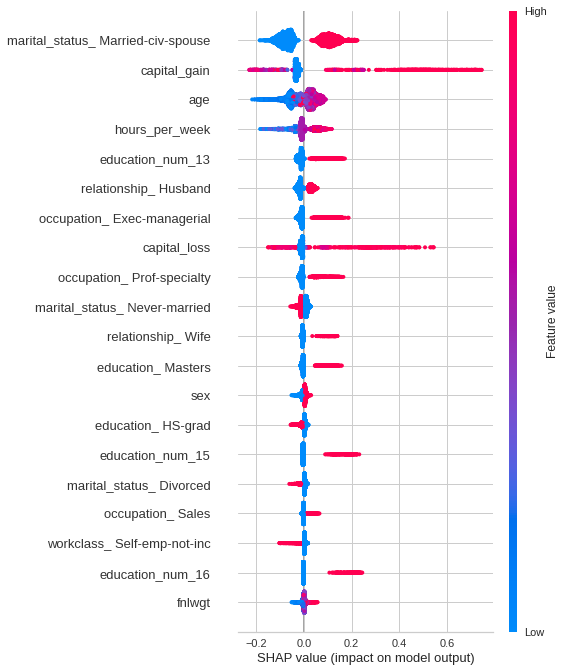

In [ ]:
interpret_model(tuned_lightgbm_model)

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=LGBMRegressor(bagging_fraction=0.5, bagging_freq=0, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=0.8,
              importance_type='split', learning_rate=0.15, max_depth=-1,
              min_child_samples=76, min_child_weight=0.001, min_split_gain=0.2,
              n_estimators=290, n_jobs=-1, num_leaves=70, objective=None,
              random_state=6810, reg_alpha=4, reg_lambda=0.5, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=correlation, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: correlation
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values
INFO:logs:model type detected: type 2
INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed.......

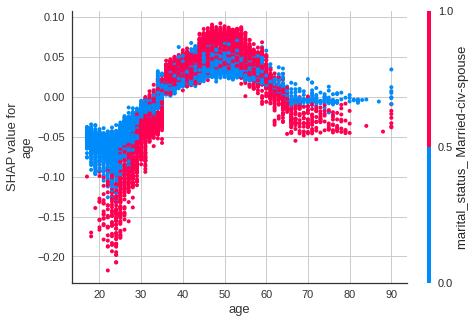

In [ ]:
interpret_model(tuned_lightgbm_model,plot='correlation')

# **8. Evaluate Model**

The evaluate_model() function is used to evaluate the performance of the model on the test set.

In [ ]:
evaluate_model(tuned_lightgbm_model)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=LGBMRegressor(bagging_fraction=0.5, bagging_freq=0, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=0.8,
              importance_type='split', learning_rate=0.15, max_depth=-1,
              min_child_samples=76, min_child_weight=0.001, min_split_gain=0.2,
              n_estimators=290, n_jobs=-1, num_leaves=70, objective=None,
              random_state=6810, reg_alpha=4, reg_lambda=0.5, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **9. Finalize Model**

After the model has been evaluated, the finalize_model() function can be used to finalize the model for deployment.

In [ ]:
final_lightgbm = finalize_model(tuned_lightgbm_model)

INFO:logs:Initializing finalize_model()
INFO:logs:finalize_model(estimator=LGBMRegressor(bagging_fraction=0.5, bagging_freq=0, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=0.8,
              importance_type='split', learning_rate=0.15, max_depth=-1,
              min_child_samples=76, min_child_weight=0.001, min_split_gain=0.2,
              n_estimators=290, n_jobs=-1, num_leaves=70, objective=None,
              random_state=6810, reg_alpha=4, reg_lambda=0.5, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0), fit_kwargs=None, groups=None, model_only=True, display=None, experiment_custom_tags=None, return_train_score=False)
INFO:logs:Finalizing LGBMRegressor(bagging_fraction=0.5, bagging_freq=0, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=0.8,
              importance_type='split', learning_rate=0.15, max_depth=-1,
              min_child_samples=76,

In [ ]:
final_lightgbm

LGBMRegressor(bagging_fraction=0.5, bagging_freq=0, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=0.8,
              importance_type='split', learning_rate=0.15, max_depth=-1,
              min_child_samples=76, min_child_weight=0.001, min_split_gain=0.2,
              n_estimators=290, n_jobs=-1, num_leaves=70, objective=None,
              random_state=6810, reg_alpha=4, reg_lambda=0.5, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

# **10. Predict Model**

Finally, the predict_model() function is used to make predictions on new data using the finalized model.

In [ ]:
predict_model(tuned_lightgbm_model)

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=LGBMRegressor(bagging_fraction=0.5, bagging_freq=0, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=0.8,
              importance_type='split', learning_rate=0.15, max_depth=-1,
              min_child_samples=76, min_child_weight=0.001, min_split_gain=0.2,
              n_estimators=290, n_jobs=-1, num_leaves=70, objective=None,
              random_state=6810, reg_alpha=4, reg_lambda=0.5, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0), probability_threshold=None, encoded_labels=True, drift_report=False, raw_score=False, round=4, verbose=True, ml_usecase=MLUsecase.REGRESSION, display=None, drift_kwargs=None)
INFO:logs:Checking exceptions
INFO:logs:Preloading libraries
INFO:logs:Preparing display monitor


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Light Gradient Boosting Machine,0.1929,0.0907,0.3012,0.498,0.2117,0.404


,age,fnlwgt,sex,capital_gain,capital_loss,hours_per_week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,...,native_country_ Scotland,native_country_ South,native_country_ Taiwan,native_country_ Thailand,native_country_ Trinadad&Tobago,native_country_ United-States,native_country_ Vietnam,native_country_ Yugoslavia,income,Label
0,33.0,204752.0,1,0.0,0.0,40.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0,0.009035
1,36.0,313853.0,1,0.0,0.0,45.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1,0.160207
2,52.0,122109.0,0,0.0,323.0,40.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0,0.065464
3,26.0,76996.0,0,0.0,0.0,38.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0,0.006175
4,55.0,106740.0,1,0.0,0.0,40.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1,0.507353
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9764,37.0,31368.0,1,0.0,0.0,40.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0,0.278087
9765,42.0,132481.0,0,0.0,0.0,24.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0,0.057964
9766,37.0,187346.0,0,0.0,0.0,40.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.004822
9767,51.0,201127.0,1,0.0,0.0,45.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0,0.091045


# **11. Save Model**

In [ ]:
save_model(tuned_lightgbm_model,'lightgbm_model')

INFO:logs:Initializing save_model()
INFO:logs:save_model(model=LGBMRegressor(bagging_fraction=0.5, bagging_freq=0, boosting_type='gbdt',
              class_weight=None, colsample_bytree=1.0, feature_fraction=0.8,
              importance_type='split', learning_rate=0.15, max_depth=-1,
              min_child_samples=76, min_child_weight=0.001, min_split_gain=0.2,
              n_estimators=290, n_jobs=-1, num_leaves=70, objective=None,
              random_state=6810, reg_alpha=4, reg_lambda=0.5, silent='warn',
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0), model_name=lightgbm_model, prep_pipe_=Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[], target='income',
                        

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[], target='income',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_strategy=...
                                boosting_type='gbdt', class_weight=None,
                                colsample_bytree=1.0, feature_fraction=0.8,
                                importance_type='split', learning_rate=0.15,
                                max_depth=-1, min_child_samples=76,
                   

In [ ]:
!ls

income_evaluation.csv  lightgbm_model.pkl  logs.log  sample_data


In [ ]:
from pycaret.regression import load_model

In [ ]:
load_lightgbm = load_model('lightgbm_model')

INFO:logs:Initializing load_model()
INFO:logs:load_model(model_name=lightgbm_model, platform=None, authentication=None, verbose=True)


Transformation Pipeline and Model Successfully Loaded


In [ ]:
load_lightgbm

Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[], target='income',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strategy=...
                               boosting_type='gbdt', class_weight=None,
                               colsample_bytree=1.0, feature_fraction=0.8,
                               importance_type='split', learning_rate=0.15,
                               max_depth=-1, min_child_samples=76,
                               min_